# AQI ANALYSIS 

### In this notebook we observe the AQI Trends for US from the year 2000-2021. We also delve deeper into the year 2022 to get insights for the AQI variation duing Covid-19 spread

#### Importing libraries

In [1]:
!pip install seaborn

In [1]:
# importing libraries
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

#### Data Loading
We load the data into a dataframe from the year 2000 to 2022

In [5]:
# loading data
def calculate_average_aqi_by_state():
    base_url = "https://emd-coding-challenge.s3.us-east-2.amazonaws.com/covid-19-aqi/aqi/daily_aqi_by_county_"
    years = range(2000, 2022)  # 2000 to 2021 inclusive
    average_aqi_by_state = {}

    for year in years:
        url = f"{base_url}{year}.csv.bz2"
        try:
            df = pd.read_csv(url, compression='bz2')
            # Assuming 'State' and 'AQI' are the column names
            avg_aqi = df.groupby('State Name')['AQI'].mean()
            average_aqi_by_state[year] = avg_aqi.to_dict()
        except Exception as e:
            print(f"Error processing file for year {year}: {e}")
            continue

    return average_aqi_by_state


In [6]:
aqi_data = calculate_average_aqi_by_state()


/anaconda/envs/azureml_py38/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3448: DtypeWarning: Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.
  if await self.run_code(code, result, async_=asy):


In [7]:
print(aqi_data)

{2000: {'Alabama': 56.97578125, 'Alaska': 30.6559934318555, 'Arizona': 55.952263952263955, 'Arkansas': 49.00754603078781, 'California': 61.82846833261525, 'Canada': 32.13100436681223, 'Colorado': 38.3024225058609, 'Connecticut': 48.38687035507845, 'Country Of Mexico': 88.98991172761664, 'Delaware': 62.03395399780942, 'District Of Columbia': 64.84972677595628, 'Florida': 48.42237736542348, 'Georgia': 54.41532954825969, 'Hawaii': 31.604129263913823, 'Idaho': 35.247185628742514, 'Illinois': 45.8856568523117, 'Indiana': 48.47219636055861, 'Iowa': 41.90405117270789, 'Kansas': 45.64185110663984, 'Kentucky': 51.31555295037124, 'Louisiana': 53.248008959681435, 'Maine': 31.346121998343914, 'Maryland': 53.34905428641611, 'Massachusetts': 46.42410855159356, 'Michigan': 42.298602462986025, 'Minnesota': 31.517679282868524, 'Mississippi': 56.6276262852034, 'Missouri': 49.800106990014264, 'Montana': 33.640280354566066, 'Nebraska': 36.15810732833237, 'Nevada': 46.047916666666666, 'New Hampshire': 36.6

So the output shows the average AQI for each state year wise

Now we create a dataframe for processing and plotting AQI values pertaining to location

In [8]:
data = []
for year, states in aqi_data.items():
    for state, aqi in states.items():
        data.append((year, state, aqi))
df_aqi = pd.DataFrame(data, columns=['Year', 'State', 'Average_AQI'])

df_aqi.to_csv('average_aqi_by_state_and_year.csv', index=False)

In [6]:
df_aqi

,Year,State,Average_AQI
0,2000,Alabama,56.975781
1,2000,Alaska,30.655993
2,2000,Arizona,55.952264
3,2000,Arkansas,49.007546
4,2000,California,61.828468
...,...,...,...
1190,2021,Virginia,34.711193
1191,2021,Washington,26.637581
1192,2021,West Virginia,35.088674
1193,2021,Wisconsin,40.968757


## Visualizations for AQI and Location

In [2]:
from matplotlib import pyplot as plt
import seaborn as sns

#### Barplot for Average AQI vs Year

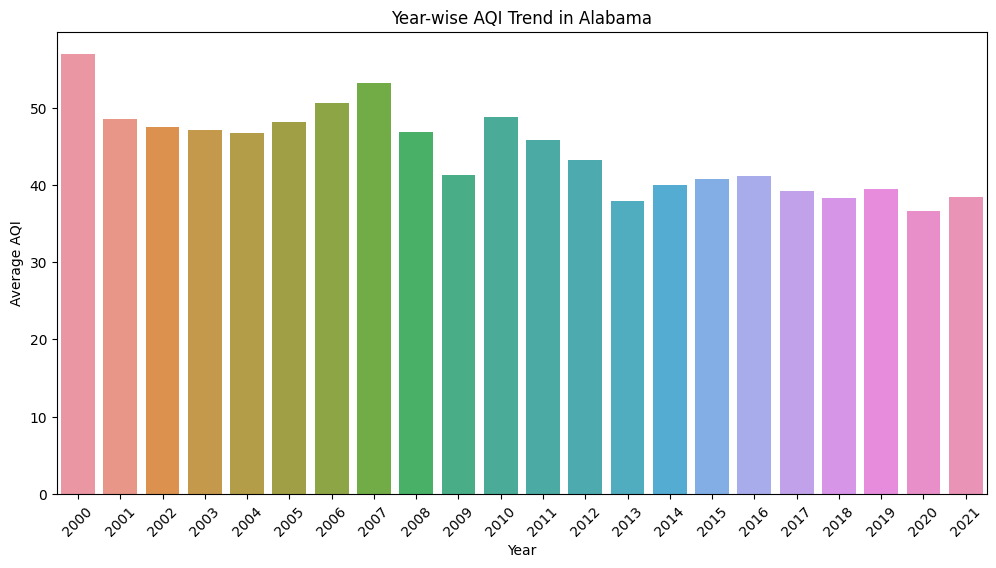

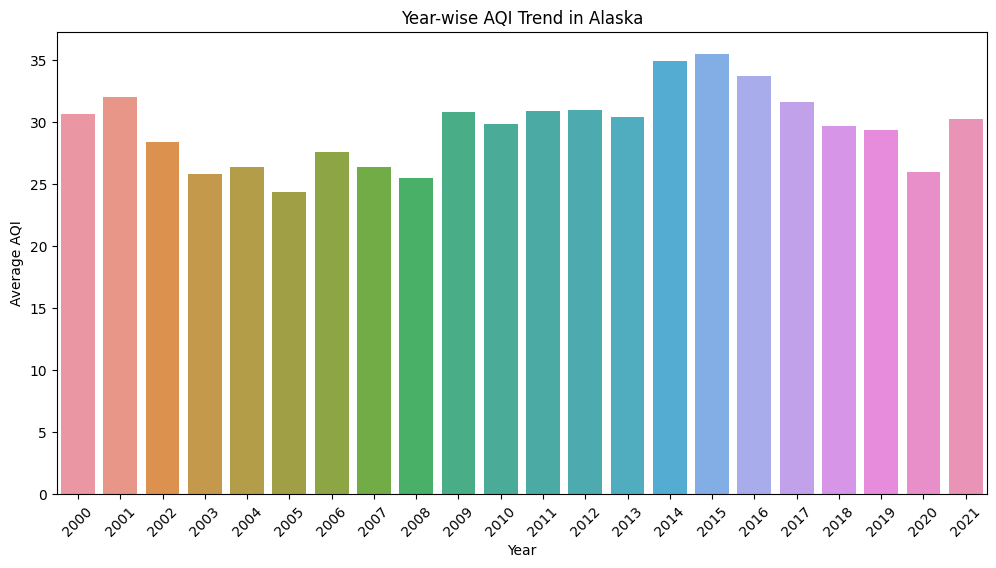

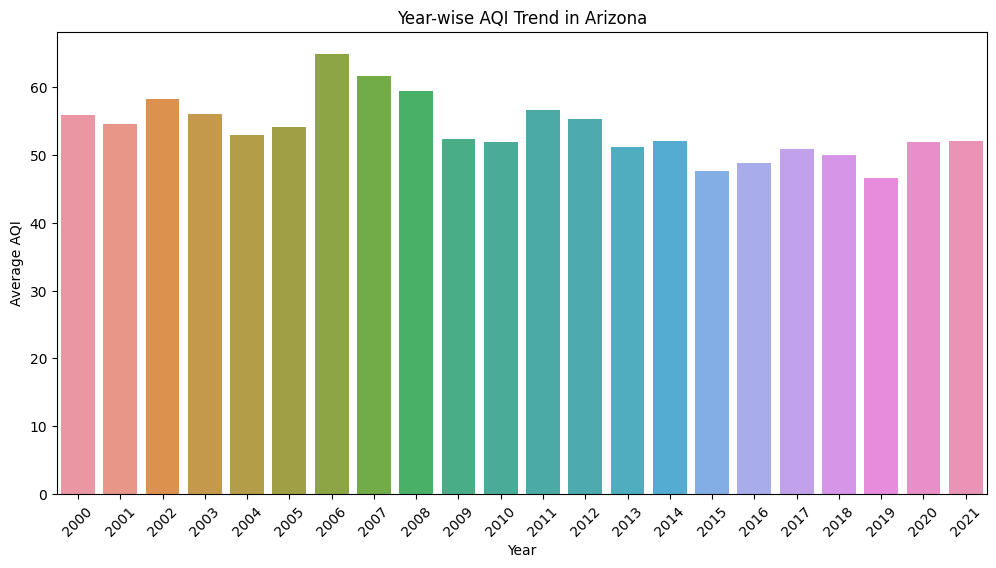

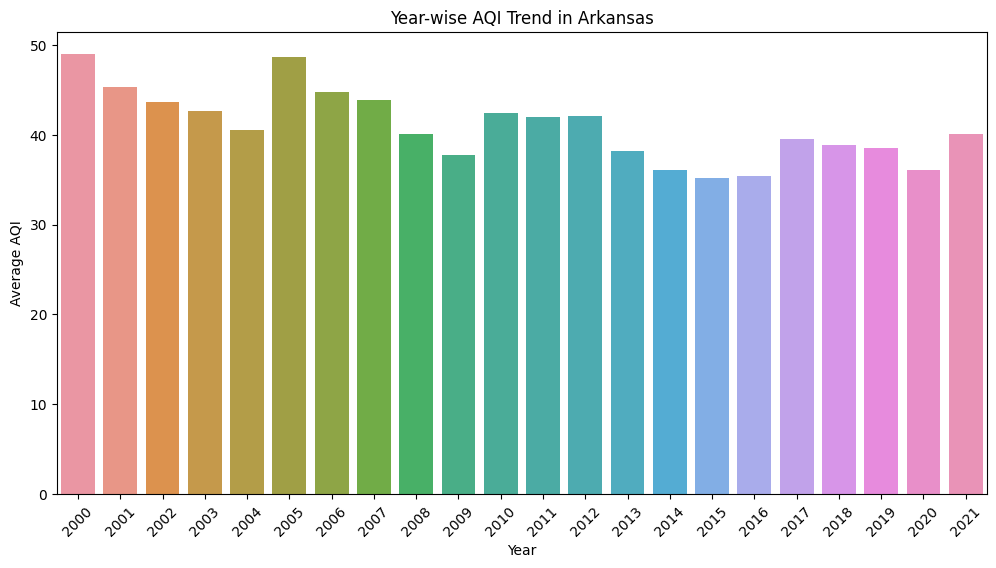

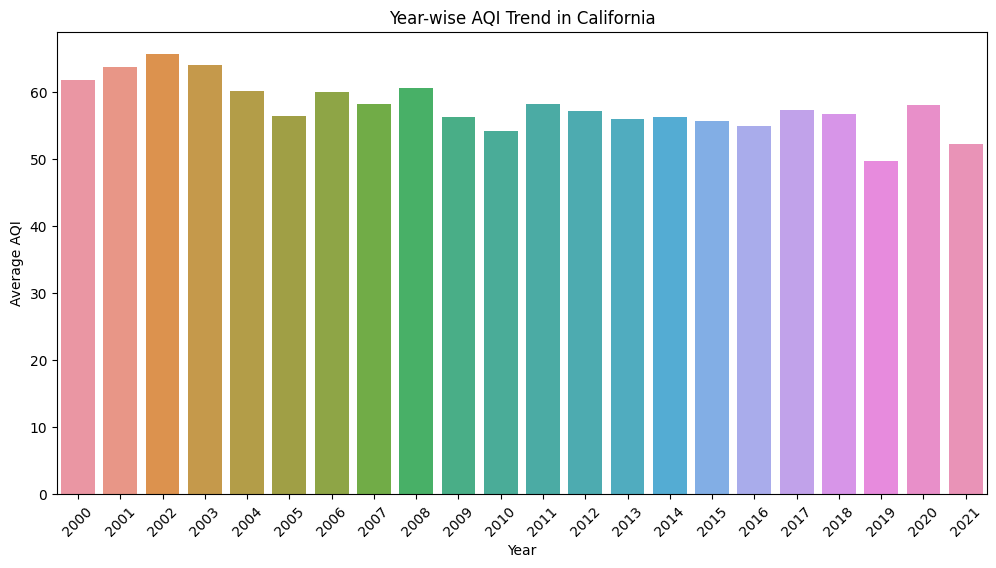

...

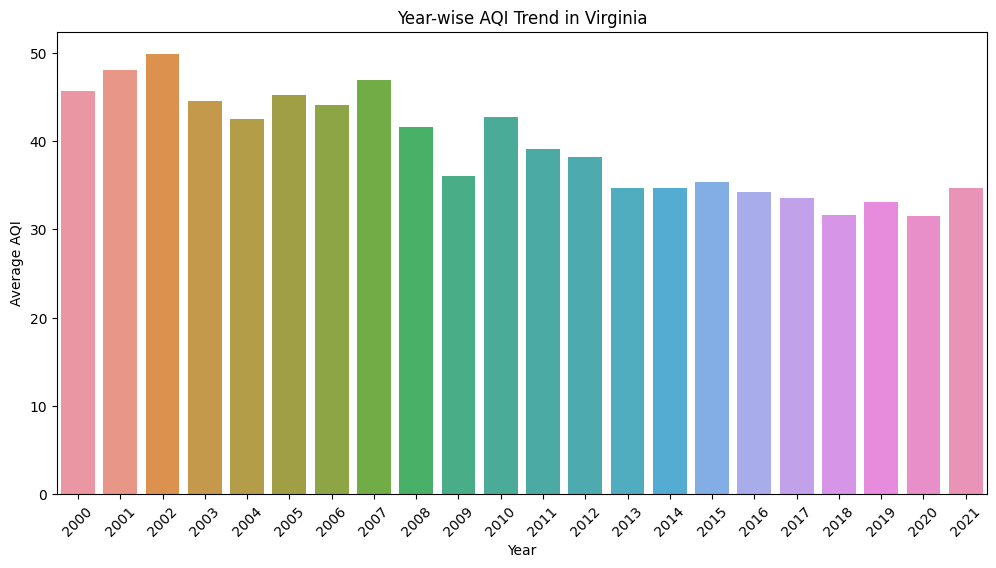

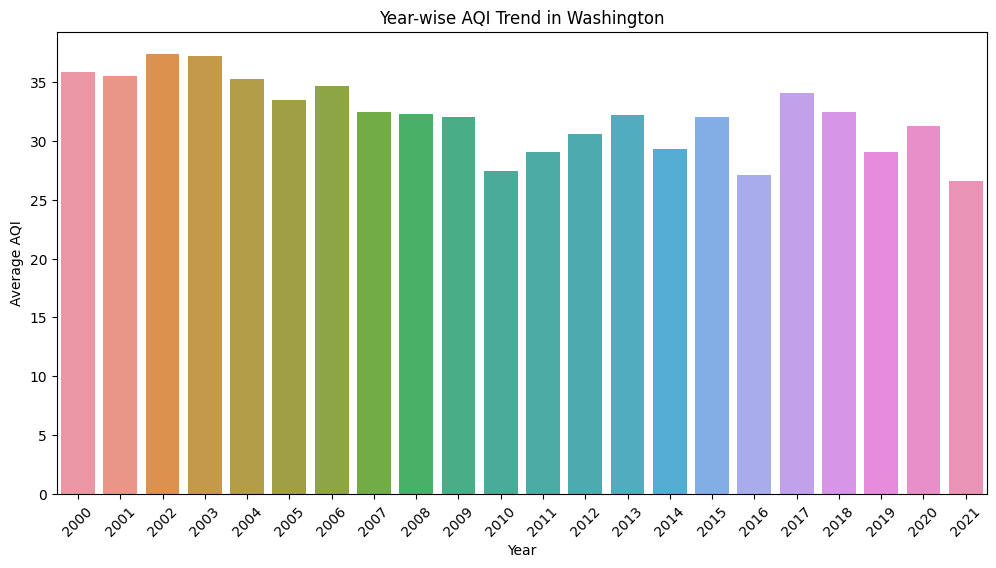

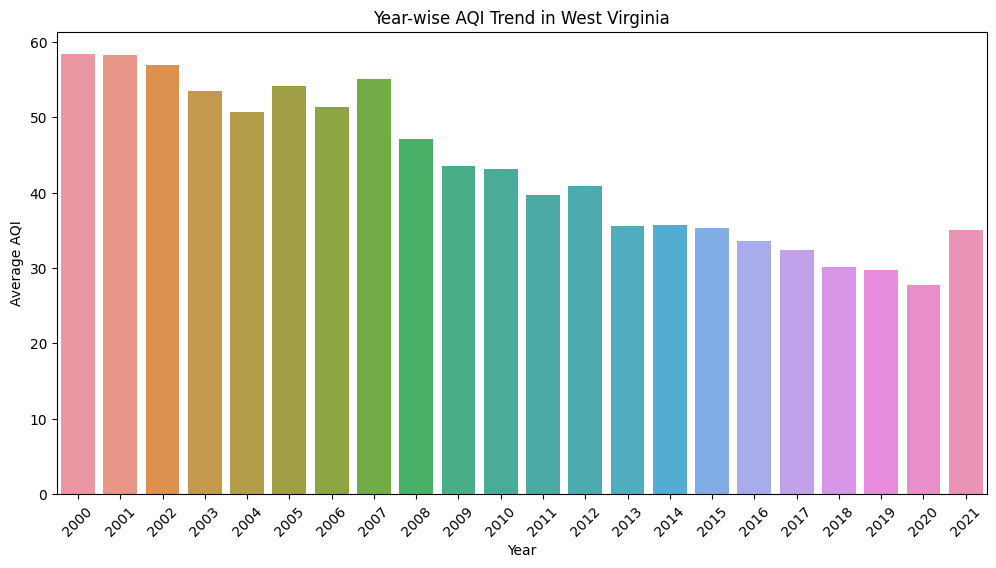

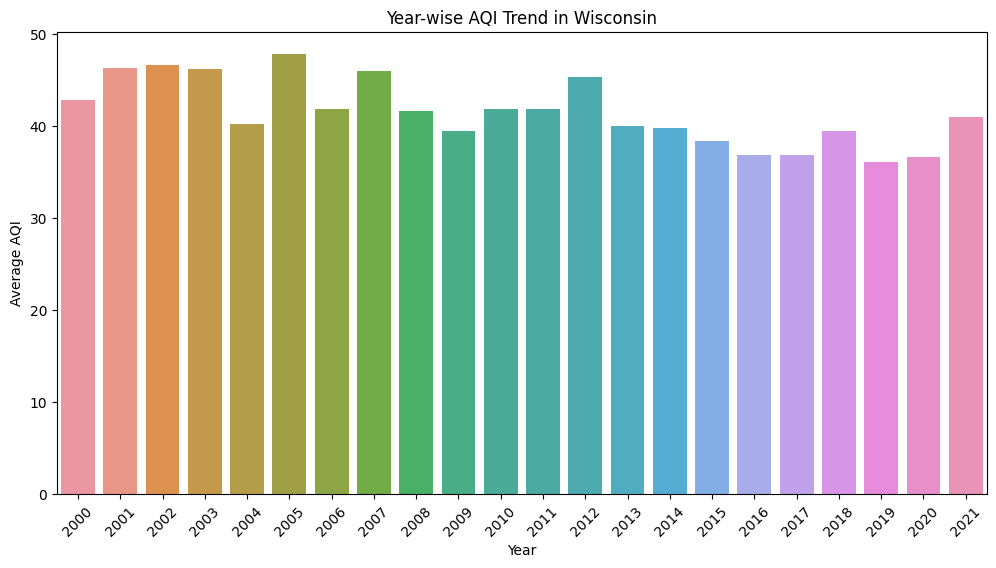

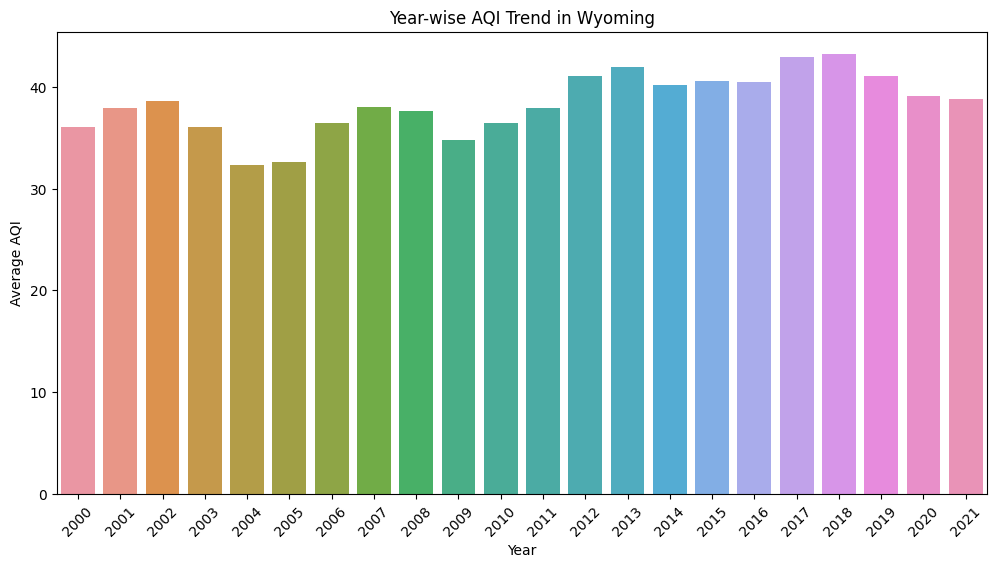

In [10]:

for state in df_aqi['State'].unique():
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Year', y='Average_AQI', data=df_aqi[df_aqi['State'] == state])
    plt.title(f'Year-wise AQI Trend in {state}')
    plt.xticks(rotation=45)
    plt.ylabel('Average AQI')
    plt.xlabel('Year')
    plt.show()


#### Insights
1. For most of the states for the year 2020, there has been a slight decrease in AQI. It may be evident that these states are affected most by Covid-19. As lockdowns were imposed, the movement of vehicles reduced. This may lead to decrease in the AQI for most of the states during the year 2020.
2. For states like California, County of Mexico, Idaho,Montana, there has been an anomalic increase in AQI for the year 2020.
This maybe due to the overall AQI increase in the state or the places where there is high AQI such that, it may overall increase the weighted Average of AQI. These places may have power plants.
3. Most notable increase in AQI was found in Oregon State.
4. Most notable decrease was seen in Alaska.

In [2]:
df1 = pd.read_csv("https://emd-coding-challenge.s3.us-east-2.amazonaws.com/covid-19-aqi/aqi/daily_aqi_by_county_2020.csv.bz2",compression='bz2')
df1.head()

,State Name,county Name,State Code,County Code,Date,AQI,Category,Defining Parameter,Defining Site,Number of Sites Reporting
0,Alabama,Baldwin,1,3,2020-01-01,48,Good,PM2.5,01-003-0010,1
1,Alabama,Baldwin,1,3,2020-01-04,13,Good,PM2.5,01-003-0010,1
2,Alabama,Baldwin,1,3,2020-01-07,14,Good,PM2.5,01-003-0010,1
3,Alabama,Baldwin,1,3,2020-01-10,39,Good,PM2.5,01-003-0010,1
4,Alabama,Baldwin,1,3,2020-01-13,29,Good,PM2.5,01-003-0010,1


In [3]:
df1.isnull().sum()

State Name                   0
county Name                  0
State Code                   0
County Code                  0
Date                         0
AQI                          0
Category                     0
Defining Parameter           0
Defining Site                0
Number of Sites Reporting    0
dtype: int64

In [5]:
df1['Date'] = pd.to_datetime(df1['Date'])
df1['month'] = df1['Date'].dt.month

In [6]:
df1['month_text'] = df1['Date'].dt.strftime('%B')

In [7]:

# Define the order of the months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

# Convert 'month_text' to a categorical type with the defined order
df1['month_text'] = pd.Categorical(df1['month_text'], 
                                               categories=month_order, 
                                               ordered=True)

In [9]:
df1.head()

,State Name,county Name,State Code,County Code,Date,AQI,Category,Defining Parameter,Defining Site,Number of Sites Reporting,month,month_text
0,Alabama,Baldwin,1,3,2020-01-01,48,Good,PM2.5,01-003-0010,1,1,January
1,Alabama,Baldwin,1,3,2020-01-04,13,Good,PM2.5,01-003-0010,1,1,January
2,Alabama,Baldwin,1,3,2020-01-07,14,Good,PM2.5,01-003-0010,1,1,January
3,Alabama,Baldwin,1,3,2020-01-10,39,Good,PM2.5,01-003-0010,1,1,January
4,Alabama,Baldwin,1,3,2020-01-13,29,Good,PM2.5,01-003-0010,1,1,January


Calculating the average AQI per month for the year 2020

In [12]:
average_aqi_by_month = {}
avg_aqi = df1.groupby('State Name')['AQI'].mean()
average_aqi_by_month['month'] = avg_aqi.to_dict()



In [13]:
print(average_aqi_by_month)

{'month': {'Alabama': 36.62961285940684, 'Alaska': 25.931506849315067, 'Arizona': 51.99638451722671, 'Arkansas': 36.0296349837369, 'California': 58.11266579973992, 'Colorado': 44.82251248559355, 'Connecticut': 40.93140655105973, 'Country Of Mexico': 70.07563025210084, 'Delaware': 39.6654478976234, 'District Of Columbia': 41.478142076502735, 'Florida': 36.62835630061088, 'Georgia': 35.60825600761361, 'Hawaii': 20.287595287595288, 'Idaho': 32.43093535268546, 'Illinois': 34.87987435008665, 'Indiana': 36.08316649983317, 'Iowa': 36.687270369569916, 'Kansas': 35.87458100558659, 'Kentucky': 34.68141492265696, 'Louisiana': 35.11238471673254, 'Maine': 33.82898550724638, 'Maryland': 34.389593675307964, 'Massachusetts': 37.58176433255765, 'Michigan': 36.02076830732293, 'Minnesota': 29.995147709433425, 'Mississippi': 38.151325588322905, 'Missouri': 37.98428886438809, 'Montana': 34.93259232699892, 'Nebraska': 28.618317610062892, 'Nevada': 41.194622670333025, 'New Hampshire': 33.737769080234834, 'Ne

In [ ]:
import pandas as pd


#### Heatmap for Monthly Average AQI for a state

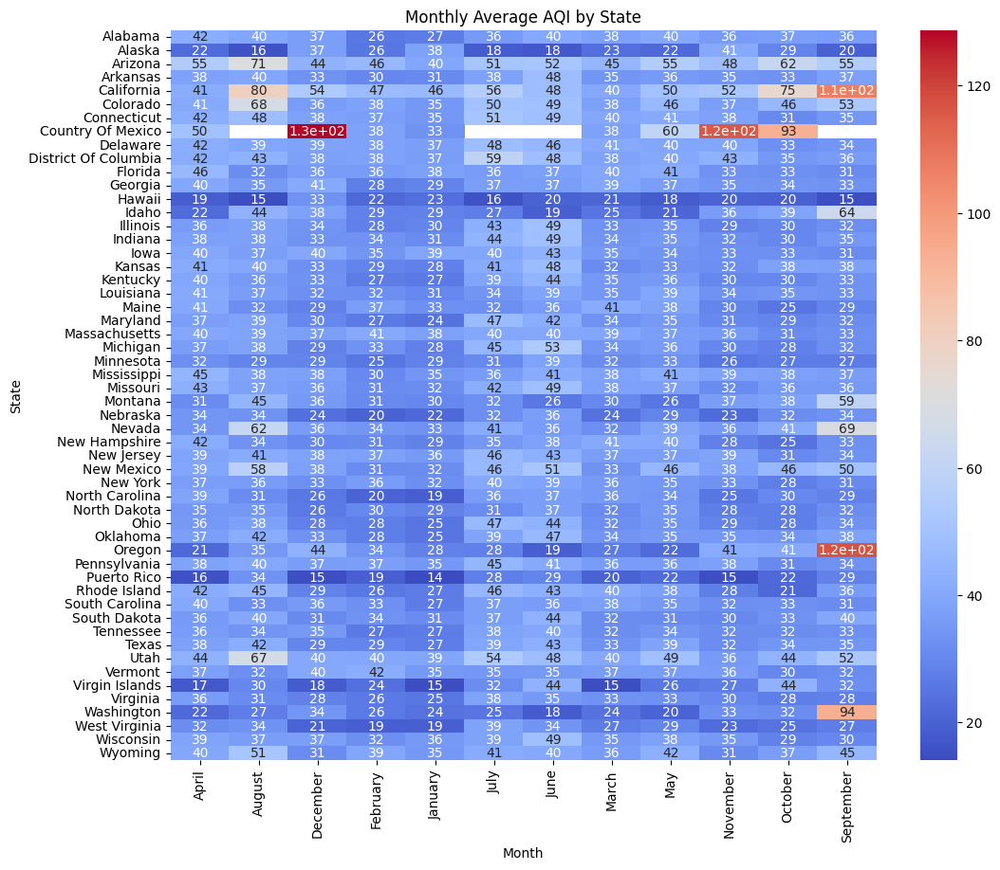

In [24]:
monthly_avg_aqi = df1.groupby(['State Name', 'month_text'])['AQI'].mean().reset_index()
pivot_df = monthly_avg_aqi.pivot(index='State Name', columns='month_text', values='AQI')
# import seaborn as sns
# import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(pivot_df, annot=True, cmap='coolwarm')  # 'annot=True' to display the values
plt.title('Monthly Average AQI by State')
plt.xlabel('Month')
plt.ylabel('State')
plt.show()


#### Insights
1. For most of the months and states the AQI values are in blue. That suggests overall AQI in US is good to moderate fot the year 2020.
2. However, in County of Mexico there has been an eccentric increase in AQI in December, November and October
3. Also for Oregon there is a sudden increase in AQI for the month of September.

These insights back our observation from the previous plots

#### Barplot of Montly Average AQI by State

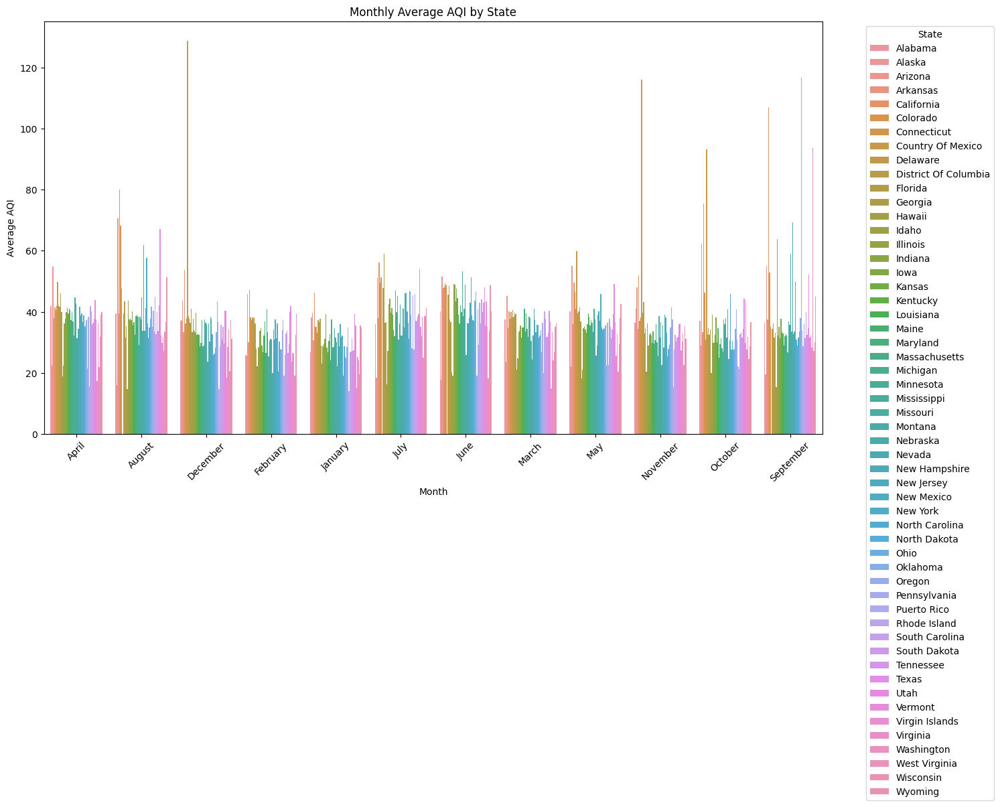

In [25]:
monthly_avg_aqi = df1.groupby(['State Name', 'month_text'])['AQI'].mean().reset_index()
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))  # Adjust figure size as needed
sns.barplot(x='State', y='AQI', hue='State Name', data=monthly_avg_aqi)
plt.title('Monthly Average AQI by State')
plt.xlabel('Month')
plt.ylabel('Average AQI')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='State', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust legend position
plt.show()


#### Insights

We can see that county of Mexico is again showing an anomaly in AQI. Also the states that are on the pink side don't show a rapid incerase in AQI

The months were in Alphabetical order. Now we convert them into their original order

In [27]:

# Define the order of the months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

# Convert 'month_text' to a categorical type with the defined order
monthly_avg_aqi['month_text'] = pd.Categorical(monthly_avg_aqi['month_text'], 
                                               categories=month_order, 
                                               ordered=True)


#### Barplot for Monthly average AQI for each state for 2020

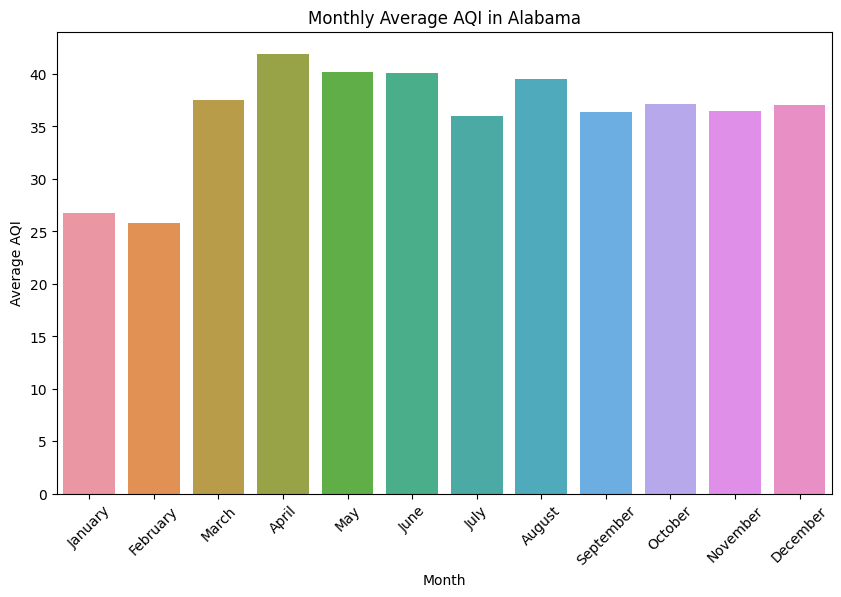

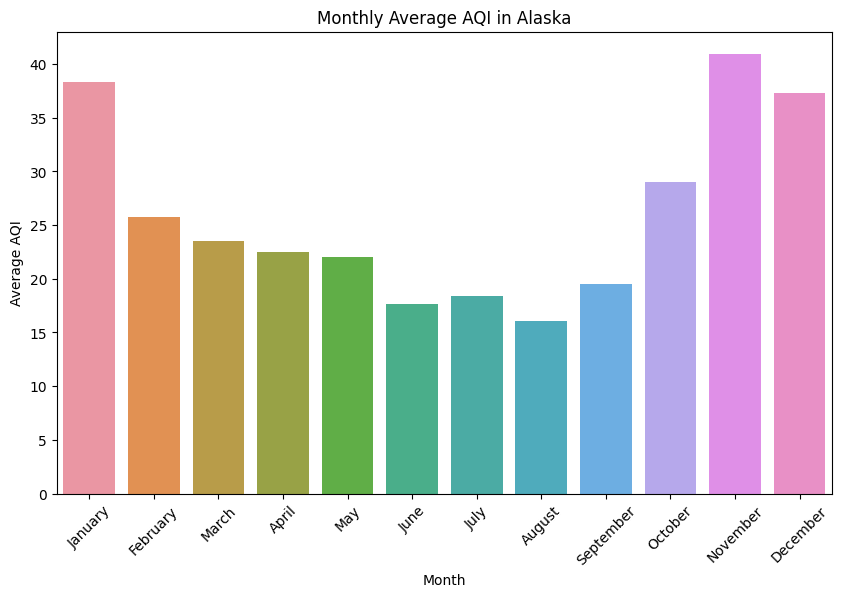

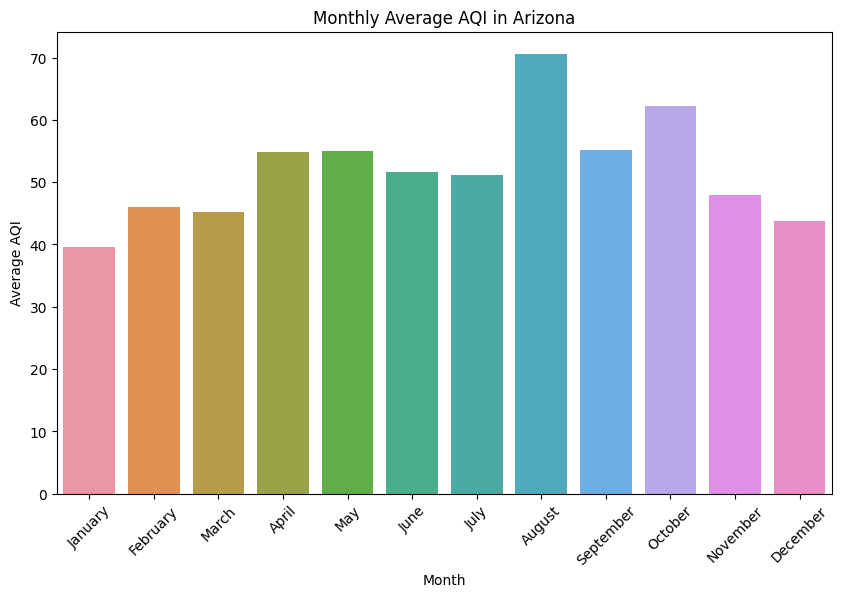

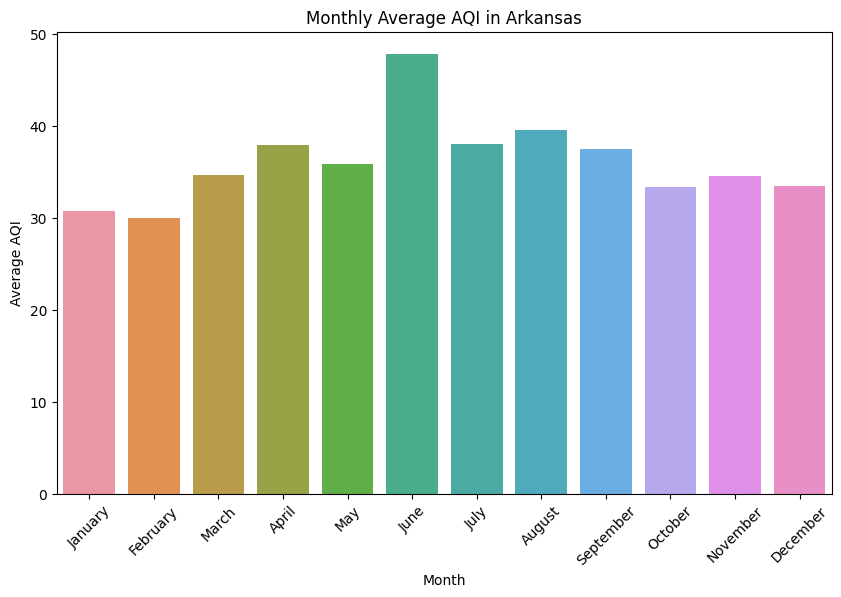

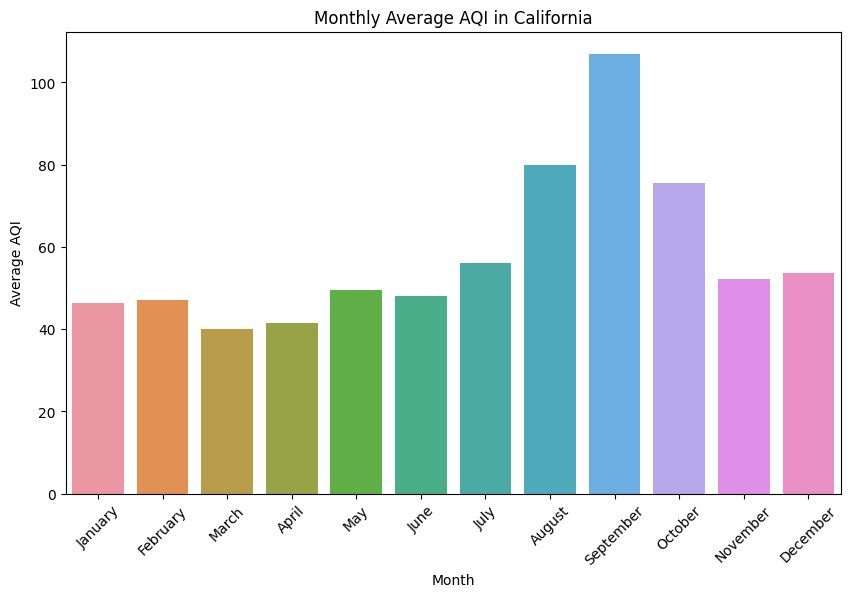

...

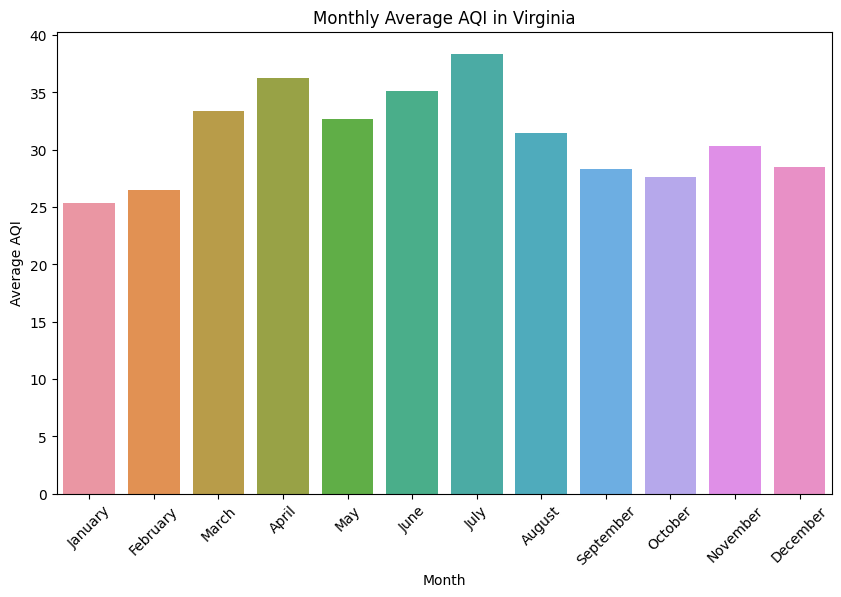

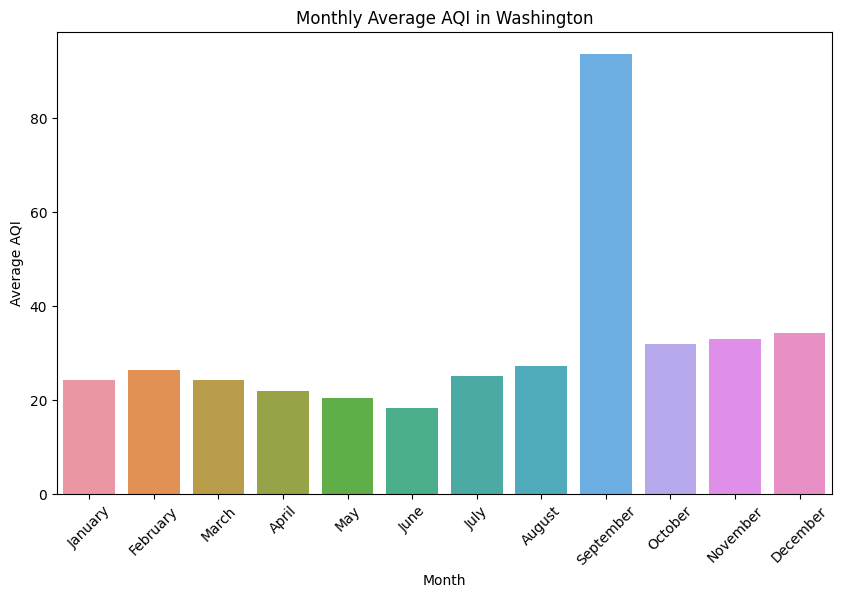

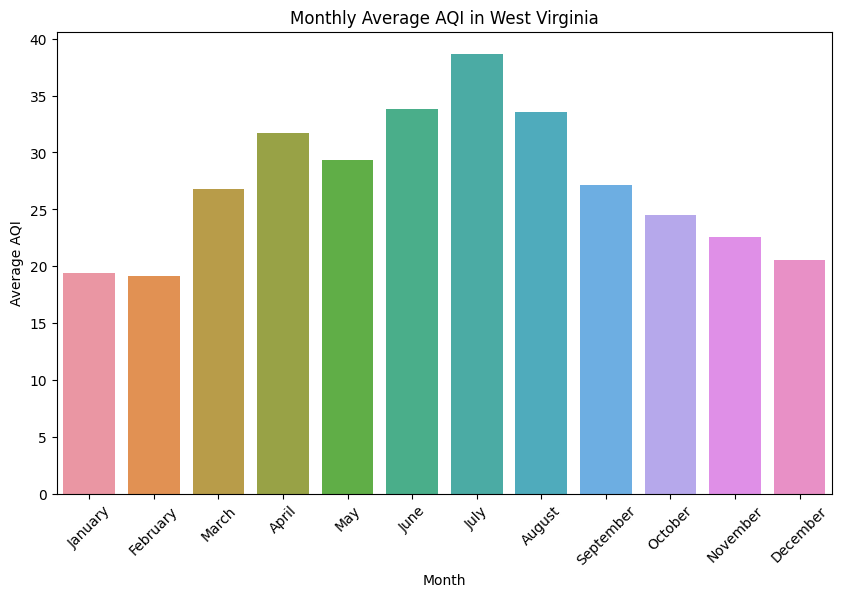

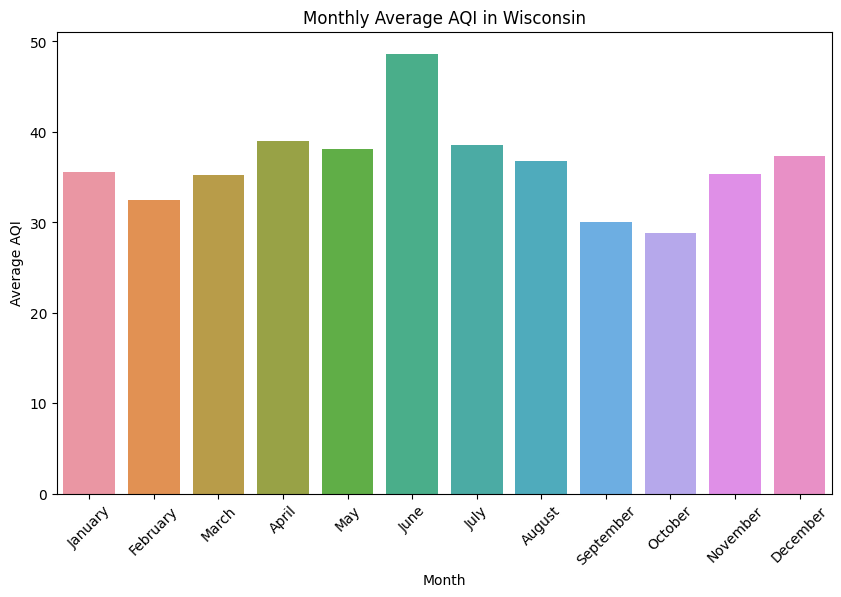

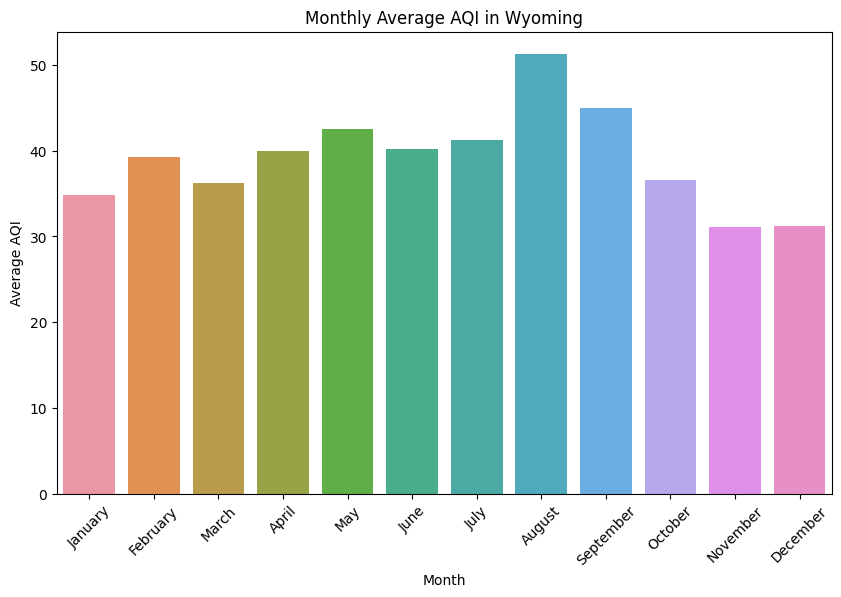

In [28]:

for state in monthly_avg_aqi['State Name'].unique():
    plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
    # Filter data for the current state
    state_data = monthly_avg_aqi[monthly_avg_aqi['State Name'] == state]
    # Create the bar plot
    sns.barplot(x='month_text', y='AQI', data=state_data)
    plt.title(f'Monthly Average AQI in {state}')
    plt.xlabel('Month')
    plt.ylabel('Average AQI')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.show()


#### Insights 
We see a general trend of decrease of AQI from months March through June. Each state is exhibiting a different behavior. This may be due to the different dates for which lockdown was imposed on different states. So we don't expect to see a similar pattern for each state in the same month.

#### Barplot for Number of Records from each county

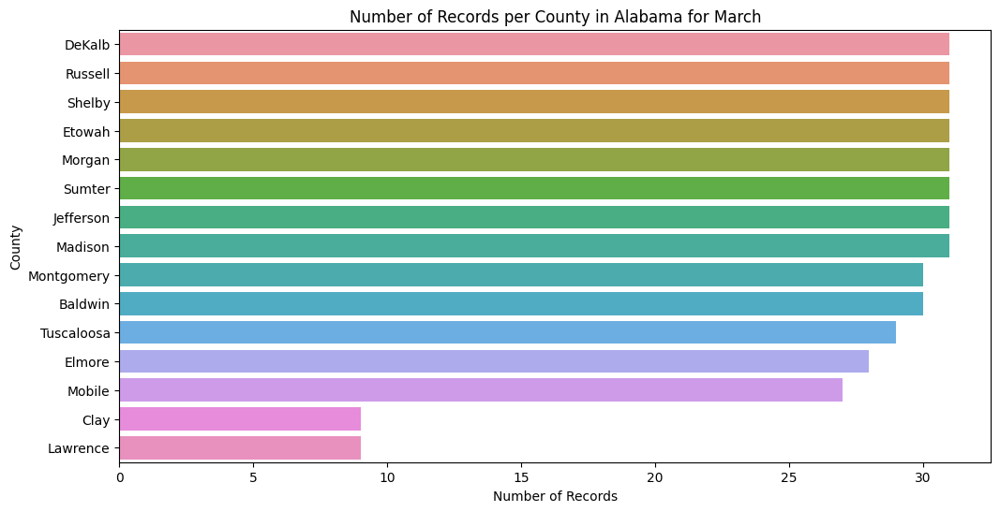

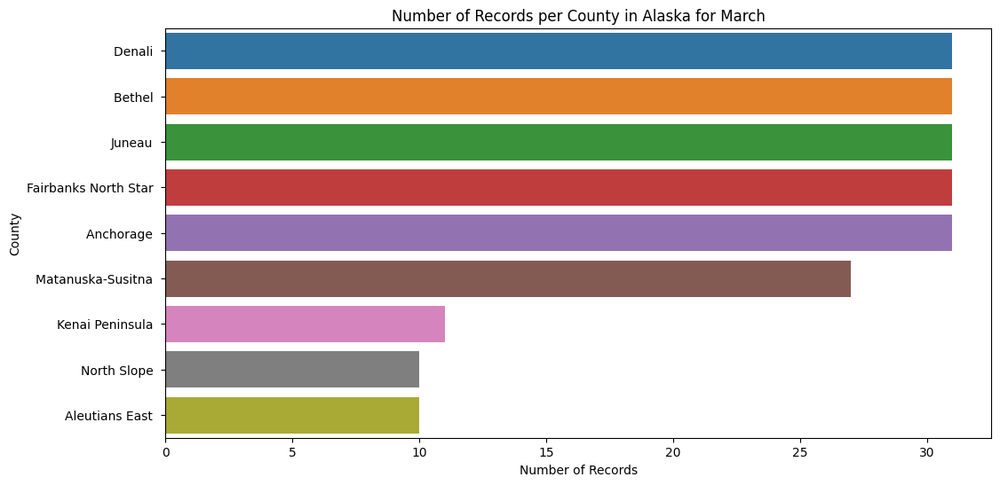

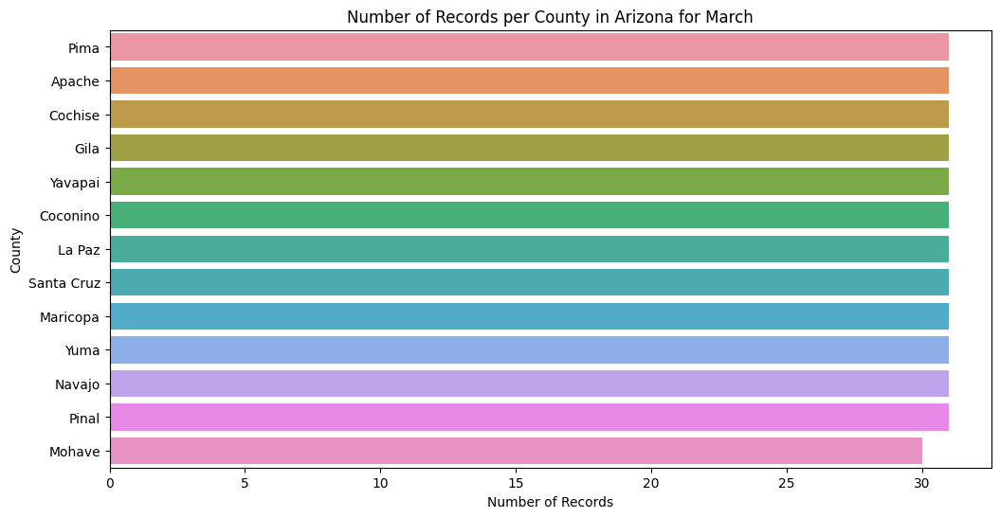

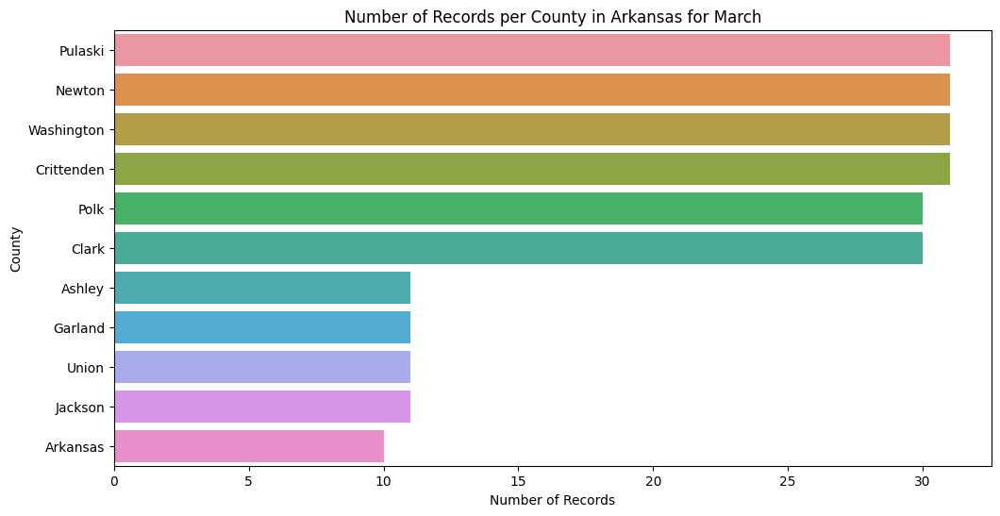

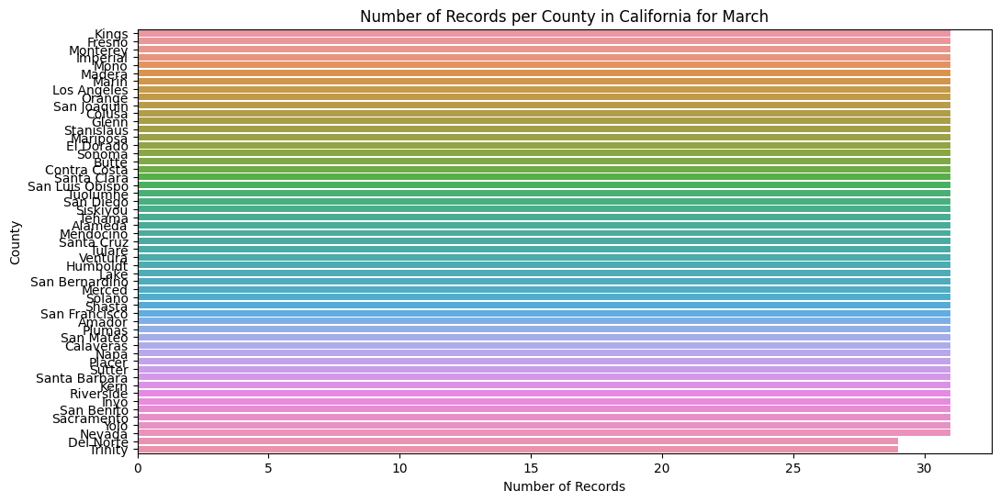

...

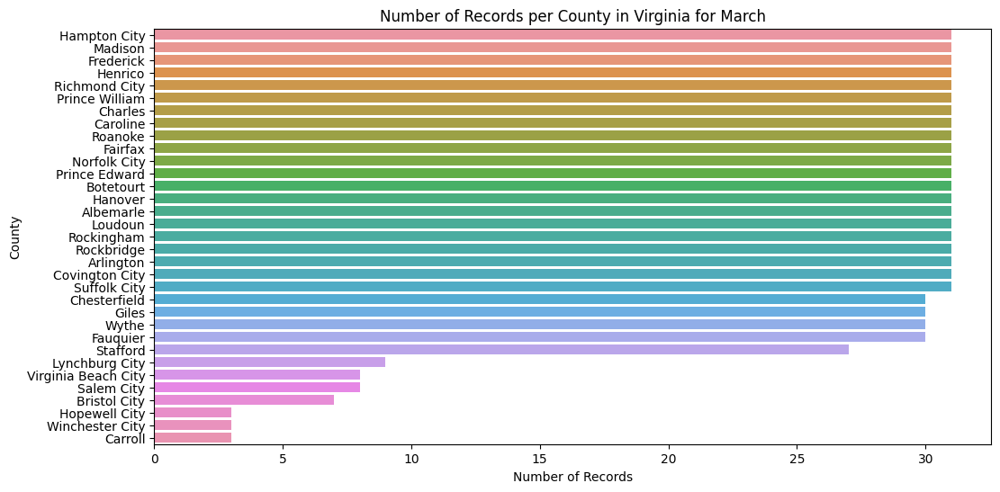

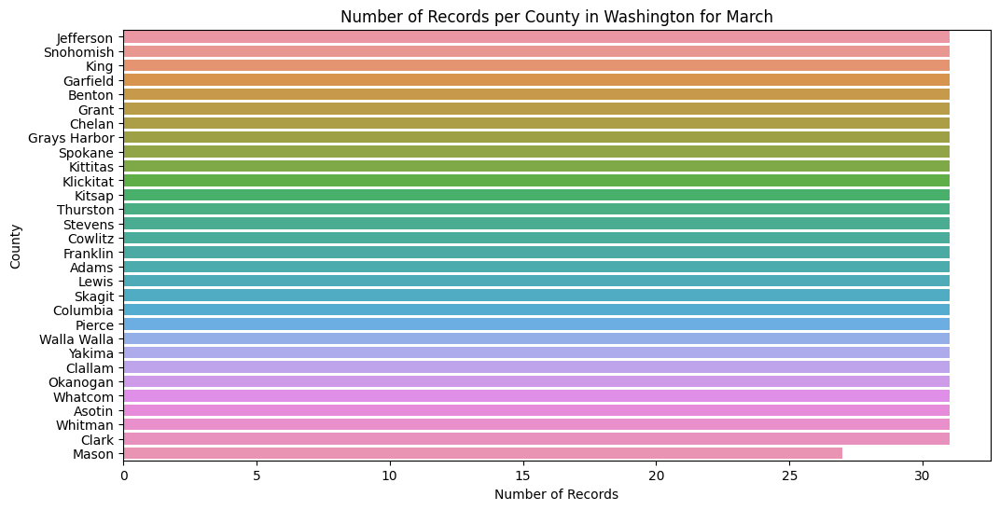

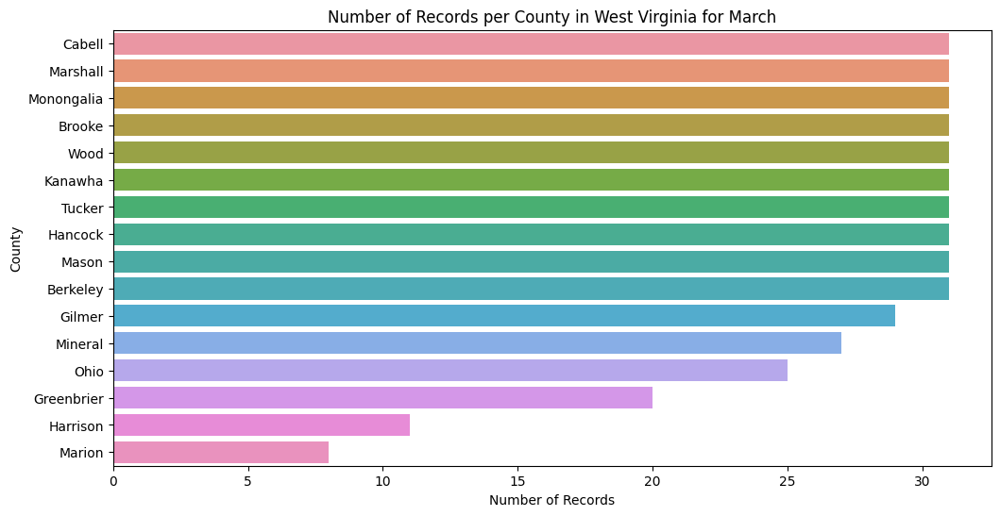

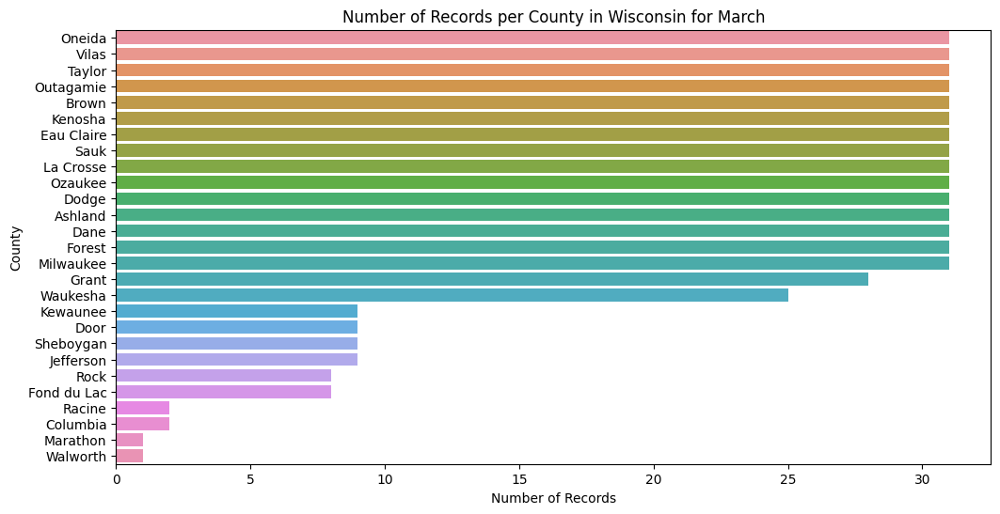

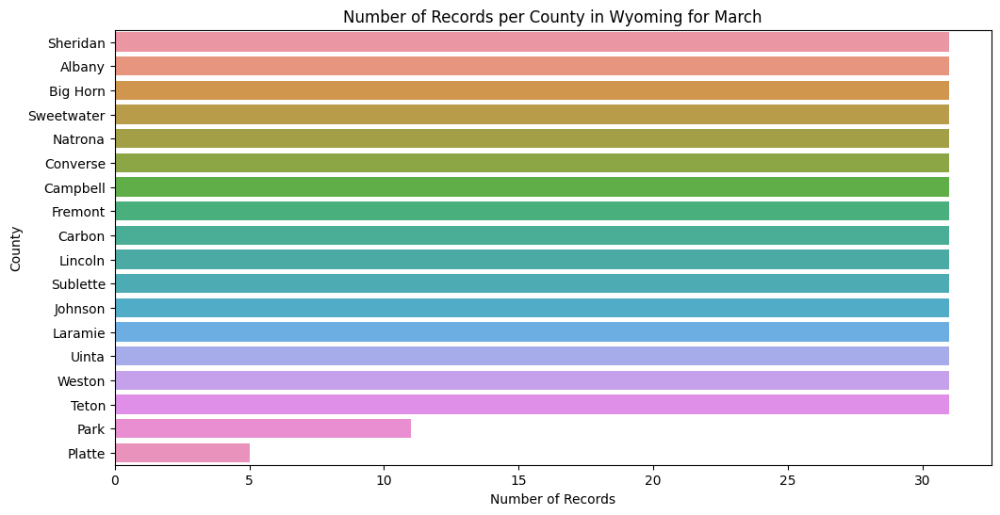

In [31]:
for state in df1['State Name'].unique():
    march_data = df1[(df1['State Name'] == state) & (df1['month_text'] == 'March')]
    county_counts = march_data['county Name'].value_counts().reset_index()
    county_counts.columns = ['county Name', 'Record_Count']
    plt.figure(figsize=(12, 6))  # Adjust the size as needed
    sns.barplot(x='Record_Count', y='county Name', data=county_counts)
    plt.title(f'Number of Records per County in {state} for March')
    plt.xlabel('Number of Records')
    plt.ylabel('County')
    plt.show()



#### Insights
We suspect that there might be a chance that the datasets contain a sample of records which may have significanyly large distribution of records taken which may have very high AQI. But seeing all the plots the dataset has even distribution of no of records for each county so that gives us clarity on our inference.

In [10]:
df1.columns

Index(['State Name', 'county Name', 'State Code', 'County Code', 'Date', 'AQI',
       'Category', 'Defining Parameter', 'Defining Site',
       'Number of Sites Reporting', 'month', 'month_text'],
      dtype='object')

In [11]:
average_aqi = df1.groupby(['State Name', 'month_text'])['AQI'].mean().reset_index()

In [14]:
import plotly.express as px

#### Line plot of Average AQI for each State

In [16]:
for state in average_aqi['State Name'].unique():
    # Filter the DataFrame for the current state
    state_data = average_aqi[average_aqi['State Name'] == state]

    # Create the plot
    fig = px.line(state_data, x='month_text', y='AQI', 
                  title=f'Average AQI in {state} by Month',
                  labels={'AQI': 'Average Air Quality Index'})
    fig.update_xaxes(type='category')  # Treat the x-axis as categorical
    fig.show()

#### Insights
For most of the states, the line plot shows that there is a decrease in AQI in the first half of the year and then a sudden increase in second half of the year but no strong pattern is seen for each state

In [18]:
import seaborn as sns

#### Face Grid plot to get a big picture of the AQI variations for states

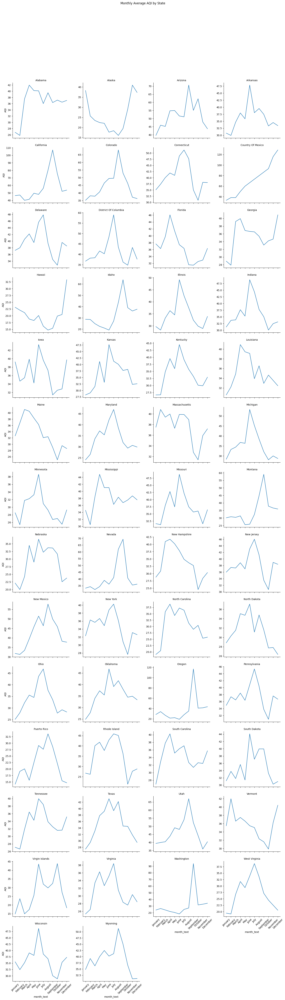

In [23]:
# Create the FacetGrid
g = sns.FacetGrid(average_aqi, col='State Name', col_wrap=4, height=4, sharey=False)
g.map(sns.lineplot, 'month_text', 'AQI')

# Set plot titles and adjust layout
g.set_titles(col_template="{col_name}")
g.set_xticklabels(rotation=45)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Monthly Average AQI by State')

# Show the plot
plt.show()

In [27]:
df2 = pd.read_csv("average_aqi_by_state_and_year.csv")

In [29]:
df2.columns

Index(['Year', 'State', 'Average_AQI'], dtype='object')

In [34]:
average_aqi_yearly = df2.groupby(['State', 'Year'])['Average_AQI'].mean().reset_index()


#### Line plot for each state year wise for AQI

In [36]:
vibrant_colors = [
    '#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', 
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', 
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', 
    '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', 
    '#ffffff', '#000000'
]
for i, state in enumerate(average_aqi_yearly['State'].unique()):
    # Ensure cycling through the color palette
    color = vibrant_colors[i % len(vibrant_colors)]

    # Filter the DataFrame for the current state
    state_data = average_aqi_yearly[average_aqi_yearly['State'] == state]

    # Create the plot
    fig = px.line(state_data, x='Year', y='Average_AQI', 
                  title=f'Average AQI in {state} by Year',
                  labels={'AQI': 'Average Air Quality Index'},
                  line_shape='linear')

    # Update the trace with the vibrant color
    fig.update_traces(line=dict(color=color))

    # Update layout for better aesthetics
    fig.update_layout(
        xaxis_title='Year',
        yaxis_title='Average AQI',
        plot_bgcolor='white',
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=True, gridcolor='lightgray')
    )

    fig.show()

#### Insights

From seeing all the plots, the general trend observed is there is dip in AQI for most of the states. But again states like California, Washington, Idaho, South Dakota show diametrically opposite behavior from the general trend. So further information is needed on that particular states to analyze the reasons for this behaviour. But the general trend suggests that there was an impact on AQI due to COVID.

# Conclusion
We tried to find any trends or patterns from plotting the states and AQI data for differnt months and years. We could observe some impact of COVID on AQI on most of the states but some states showed the opposite behaviour. Hence, we need further analysis to conclude the results for these states.  

###### **Did the lockdown result in a noticable improvement in air quality? Most notably in what regions?**
Yes the lockdown did result in a noticeable improvement in air quality for most of the states. The most notable decrease was in states like Alaska. Though some states showed an anomalous behavior s